<a href="https://colab.research.google.com/github/thesighsrikar/DL1_Boats/blob/master/TypesOfBoats_fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#PART 1: Autoreload, Importing Libraries and dataset from Kaggle

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai import *
from fastai.vision import *
from fastai.widgets import *

Make sure you download .json file from kaggle and upload it. 

In [0]:
from google.colab import files
uploaded = files.upload()

In [0]:
# Let's make sure the kaggle.json file is present.
!ls -lha kaggle.json

-rw-r--r-- 1 root root 69 Aug 27 07:06 kaggle.json


In [0]:
# Next, install the Kaggle API client.
!pip install -q kaggle

In [0]:
# The Kaggle API client expects this file to be in ~/.kaggle,
# so move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json

In [0]:
path = Path('data/')
folder = 'boats'
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

In [0]:
!cd '/content/data/boats'

Link to dataset: https://www.kaggle.com/clorichel/boat-types-recognition

In [0]:
!kaggle datasets download -d clorichel/boat-types-recognition

 98% 411M/421M [00:09<00:00, 56.2MB/s]
100% 421M/421M [00:10<00:00, 44.1MB/s]


In [0]:
#Move the .zip file to the desired destination
!mv boat-types-recognition.zip /content/data/boats

In [0]:
#Extract the content to another folder
!unzip /content/boat-types-recognition.zip -d /content/data/boats


#PART 2: Viewing Data

In [0]:
path = '/content/data/boats'

***class ImageList*** is suitable for computer vision. It inherits from ItemList and overwrite ItemList.get to call open_image in order to turn an image file in Path object into an Image object.

ImageList. init creates additional attributes like convert_mode, after_open, c, size upon ItemList.init; and convert_mode and sizes in particular are necessary to make use of ImageList.get (which also overwrites on ItemList.get) and ImageList.open.

Splitting the data between training and validation set

*split_by_rand_pct*: Split the items randomly by putting valid_pct in the validation set. Default value 0.2
Label the inputs:

*label_from_folder*: Give a label to each filename depending on its folder. Behind the scenes, when an ItemList calls label_from_folder, it creates a lambda function which outputs a foldername which a file Path object immediately or directly belongs to, and then calls label_from_func with the lambda function as input.
*transform*: Set the tfms and tfm_y value to be applied to the inputs and targets.

*get_transforms*(): The main purpose of the library is data augmentation for use when training computer vision models, you can also use it for more general image transformation purposes.

*Data Augmentation*: is perhaps the most important regularization technique when training a model for Computer Vision: instead of feeding the model with the same pictures every time, we do small random transformations (a bit of rotation, zoom, translation, etc...) that don't change what's inside the image (to the human eye) but do change its pixel values. Models trained with data augmentation will then generalize better.

In [0]:
np.random.seed(42)
data = (ImageList.from_folder(path).split_by_rand_pct()
        .label_from_folder().transform(get_transforms(), size=128).databunch().normalize(imagenet_stats))

In [0]:
data.classes

['buoy',
 'cruise ship',
 'ferry boat',
 'freight boat',
 'gondola',
 'inflatable boat',
 'kayak',
 'paper boat',
 'sailboat']

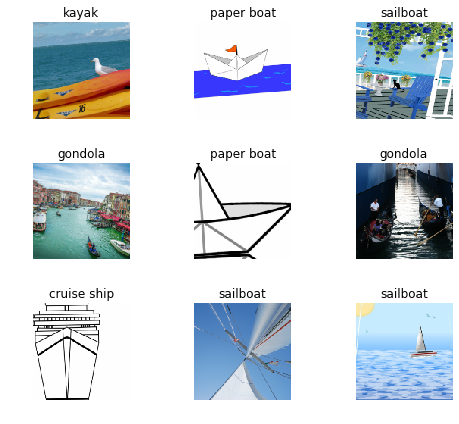

In [0]:
data.show_batch(rows=3, figsize=(7,6))

In [0]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['buoy',
  'cruise ship',
  'ferry boat',
  'freight boat',
  'gondola',
  'inflatable boat',
  'kayak',
  'paper boat',
  'sailboat'],
 9,
 1170,
 292)

Number of classes: 9
Testing: 1170
Validation: 292

#PART 3: Training the model

Transfer Learning: Transfer learning is a technique where you use a model trained on a very large dataset (usually ImageNet in computer vision) and then adapt it to your own dataset. The idea is that it has learned to recognize many features on all of this data, and that you will benefit from this knowledge, especially if your dataset is small, compared to starting from a randomly initialized model. On a wide range of tasks that transfer learning nearly always give better results.

In practice, you need to change the last part of your model to be adapted to your own number of classes. Most convolutional models end with a few linear layers (a part we will call the head). The last convolutional layer will have analyzed features in the image that went through the model, and the job of the head is to convert those in predictions for each of our classes. In transfer learning we will keep all the convolutional layers (called the body or the backbone of the model) with their weights pretrained on ImageNet but will define a new head initialized randomly.

Then we will train the model we obtain in two phases: first we freeze the body weights and only train the head (to convert those analyzed features into predictions for our own data), then we unfreeze the layers of the backbone (gradually if necessary) and fine-tune the whole model (possibly using differential learning rates).

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=accuracy)

In [0]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,2.054804,1.066557,0.681507,00:46
1,1.381554,0.714749,0.770548,00:47
2,1.065109,0.679821,0.770548,00:48
3,0.888602,0.677082,0.770548,00:48


In [0]:
learn.save('Boats_Resnet34_stage-1')

unfreeze will unfreeze all layers of your model, so you will be training the early and later layers, although you still may be training the different layer groups at different learning rates. This is called ‘discriminative learning rates’ or ‘discriminative layer training’.

In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


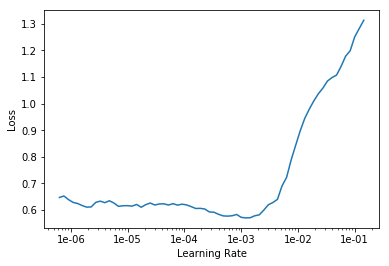

In [0]:
learn.recorder.plot()

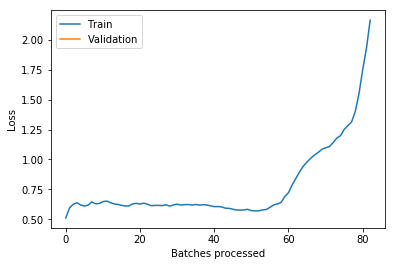

In [0]:
learn.recorder.plot_losses()

In [0]:
learn.fit_one_cycle(5, max_lr=slice(1e-5,1e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.610818,0.646230,0.780822,00:48
1,0.559209,0.604829,0.818493,00:49
2,0.521030,0.565413,0.818493,00:47
3,0.464697,0.554824,0.811644,00:47
4,0.428574,0.554815,0.811644,00:48


In [0]:
learn.save('Boats_Resnet34_stage-2')

In [0]:
data = ImageDataBunch.from_folder(path, train=".", 
                                  valid_pct=0.2,
                                  ds_tfms=get_transforms(flip_vert=False),
                                  size=224,bs=64, 
                                  num_workers=0).normalize(imagenet_stats)

In [0]:
learn.data = data
data.train_ds[0][0].shape

torch.Size([3, 224, 224])

freeze will set all of your layer groups except the last one to be untrainable. It appears from the documentation that this means we freeze the first layer group (the one that comes from transfer learning) and unfreeze the second (also last) group, to train more.

Note to self: Future tasks:- freeze_to(n:int)

In [0]:
learn.freeze()

Selecting a range fro learning rate where losses are minimum. this can be seen from the losses_plot.

In [0]:
learn.fit_one_cycle(5, slice(1e-3))

epoch,train_loss,valid_loss,accuracy,time
0,0.305443,0.171363,0.958904,01:31
1,0.322396,0.162342,0.955479,01:28
2,0.298734,0.166380,0.941781,01:28
3,0.281353,0.163972,0.948630,01:29
4,0.245779,0.166121,0.945205,01:29


In [0]:
learn.save('Boats_Resnet34_stage-3')

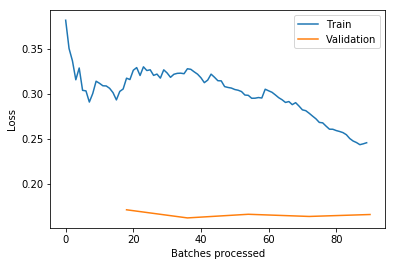

In [0]:
learn.recorder.plot_losses()

In [0]:
learn.load('Boats_Resnet34_stage-3')

Learner(data=ImageDataBunch;

Train: LabelList (1170 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
kayak,kayak,kayak,kayak,kayak
Path: /content/data/boats;

Valid: LabelList (292 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
inflatable boat,kayak,sailboat,kayak,sailboat
Path: /content/data/boats;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=

#PART 4: Interpretation of the results

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

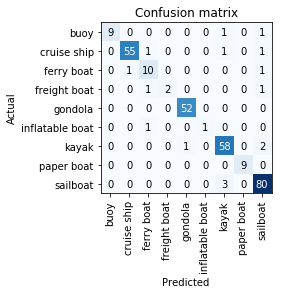

In [0]:
interp.plot_confusion_matrix()

In [0]:
learn.export() 

In [0]:
defaults.device = torch.device('cpu')

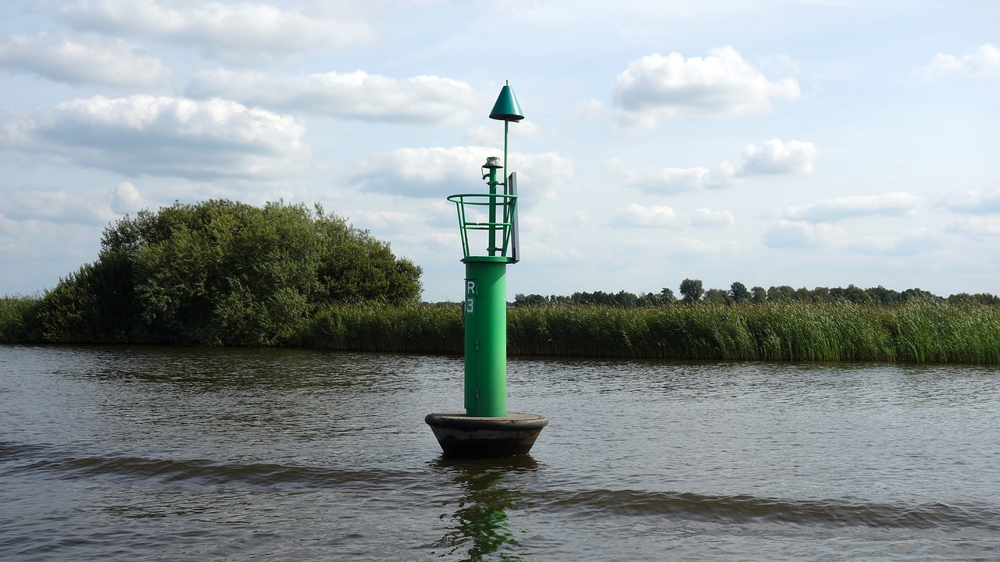

In [0]:
img1 = open_image('/content/data/boats/buoy/watermarkering-scheepvaartmarkering-2714076.jpg')
img1

In [0]:
learn = load_learner(path)

In [0]:
pred_class,pred_idx,outputs = learn.predict(img1)
pred_class

Category buoy

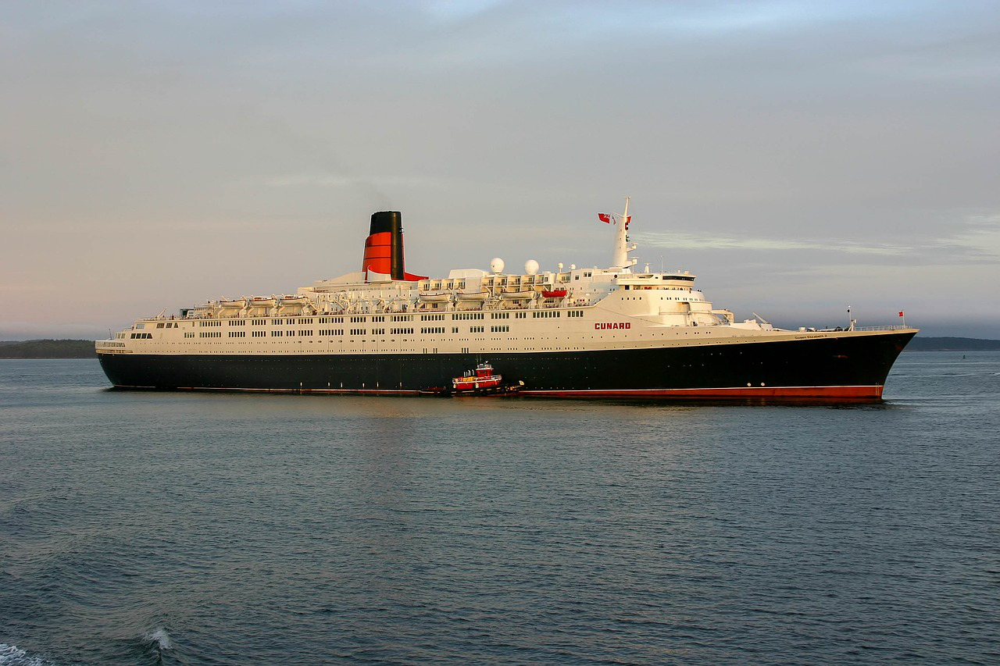

In [0]:
img2 = open_image('/content/data/boats/cruise ship/waters-sea-ship-boat-3176281.jpg')
img2

In [0]:
pred_class,pred_idx,outputs = learn.predict(img2)
pred_class

Category cruise ship

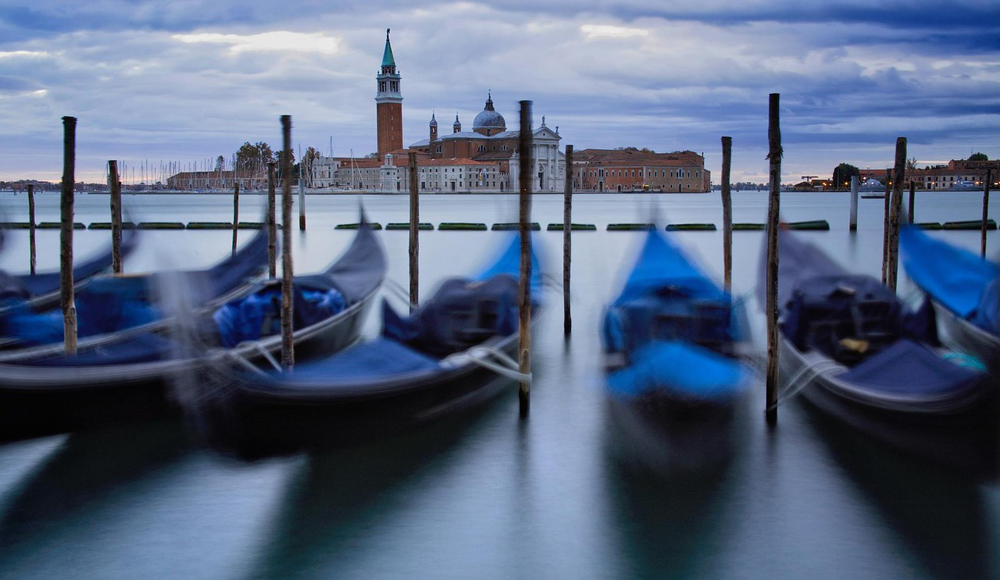

In [0]:
img3 = open_image('/content/data/boats/gondola/waters-gondola-boat-travel-sky-3247690.jpg')
img3

In [0]:
pred_class,pred_idx,outputs = learn.predict(img3)
pred_class

Category gondola

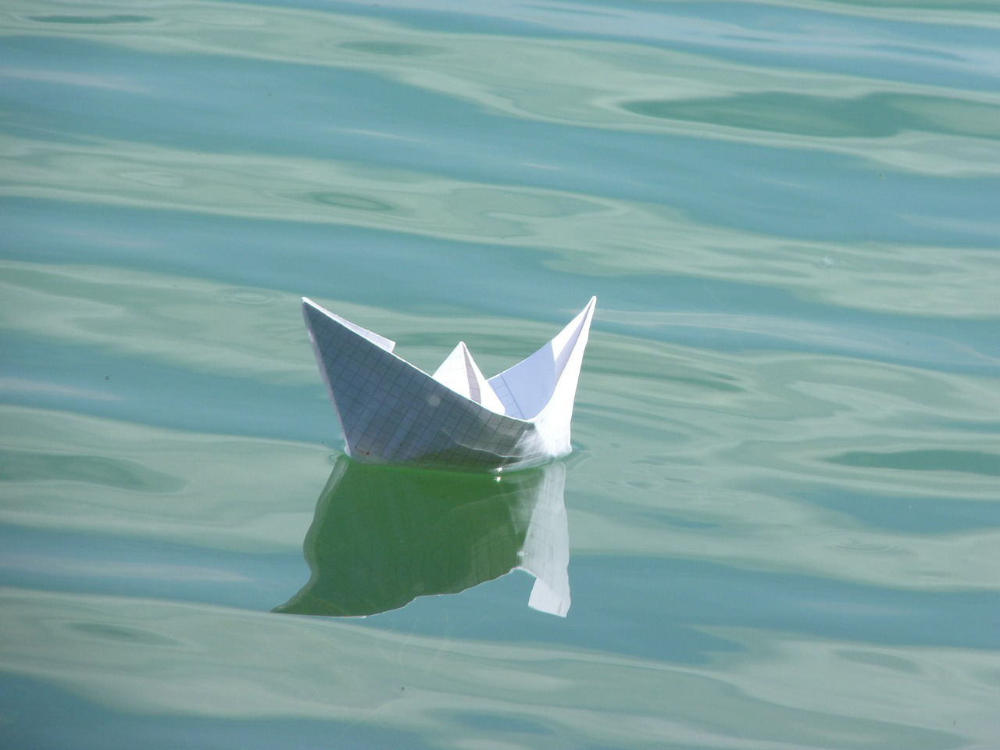

In [0]:
img4 = open_image('/content/data/boats/paper boat/papierschiff-water-boat-ship-fold-origam-389016.jpg')
img4

In [0]:
pred_class,pred_idx,outputs = learn.predict(img4)
pred_class

Category paper boat

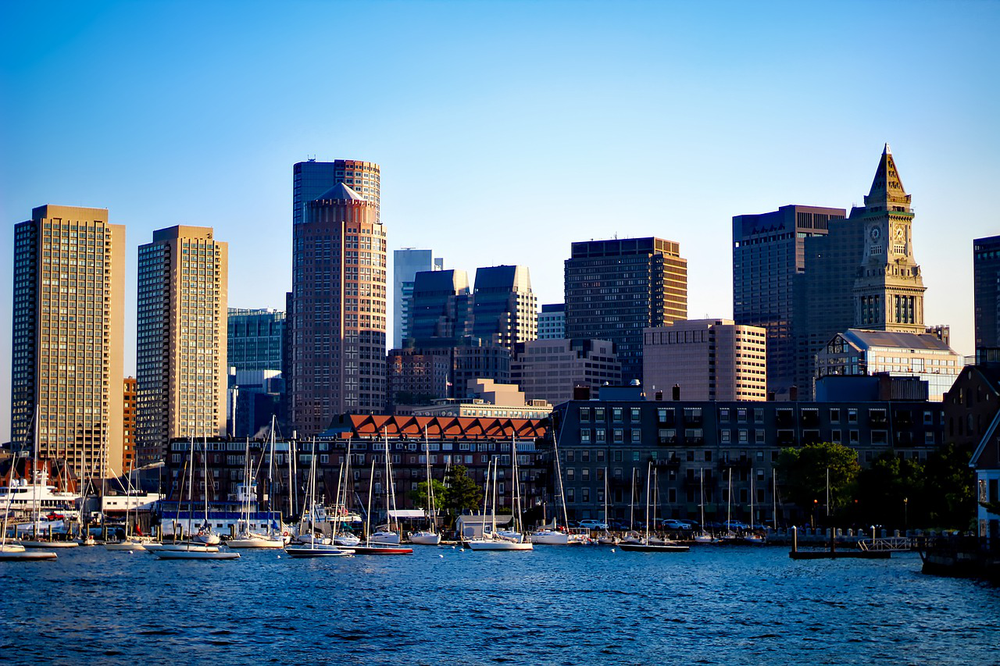

In [0]:
img5 = open_image('/content/data/boats/sailboat/boston-massachusetts-city-urban-skyline--1775870.jpg')
img5

In [0]:
pred_class,pred_idx,outputs = learn.predict(img5)
pred_class

Category sailboat

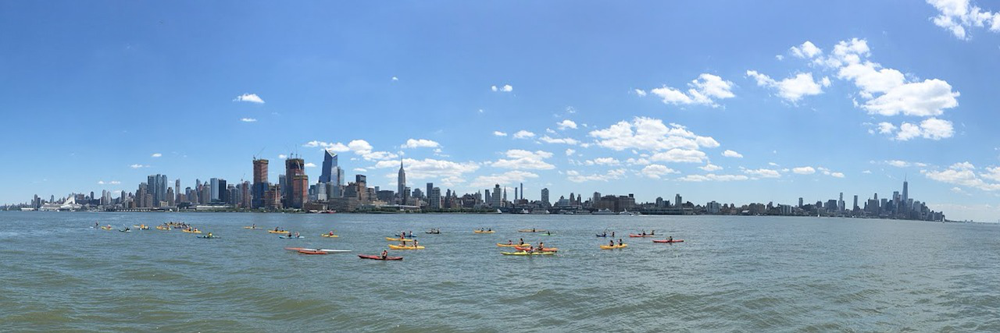

In [0]:
img6 = open_image('/content/data/boats/kayak/panoramic-new-york-city-hudson-river-2611522.jpg')
img6

In [0]:
pred_class,pred_idx,outputs = learn.predict(img6)
pred_class

Category kayak